# Smoothing comparison

### Different imports

In [1]:
from datetime import datetime
import numpy as np
import scipy
import pandas
from copy import deepcopy
import matplotlib.pyplot as plt
from ipywidgets import interact

from scipy.signal import butter,filtfilt
from scipy.interpolate import interp1d
from scipy.interpolate import splrep, splev
from scipy.signal import savgol_filter
from statsmodels.nonparametric.smoothers_lowess import lowess
from statsmodels.tsa.holtwinters import SimpleExpSmoothing
from statsmodels.nonparametric.kernel_regression import KernelReg

import pwlf

### Define a function to draw the different graphics below

In [2]:
def graphics(x, y, fmt, label, title):
    fig = plt.figure(figsize=(12,3), dpi=200)
    
    plt.title(title, size='x-large', weight='bold')
    for i in range (len(x)):
        plt.plot(x[i], y[i], fmt[i], markersize=3, label=label[i], alpha=0.7)
    plt.ylim(0,1)
    plt.ylabel('EVI', size='large', style='italic')
    plt.xlim(0,365)
    plt.xlabel("Year's day", size='large', style='italic')
    plt.legend(loc='center left', bbox_to_anchor=(1.01,0.5))
    plt.grid()
    
    fig.subplots_adjust(right=0.77)
    
    plt.show()

### Open MODIS data file, put data in an array with good types and recuperate coordinates

In [3]:
files = ['modis_pasture_A2017_square1_d_sq.txt', 'modis_pasture_A2017_square2_d_sq.txt', 'modis_pasture_A2017_square3_d_sq.txt']
modisData, transpose, xMODIS, yMODIS, coordMODIS = [], [], [], [], []

for i in range (len(files)):
    file = files[i]
    
    modisFile = open(file, 'r')
    
    transition = []
    
    for line in modisFile.readlines():
        
        line = line.replace('"',  '')
        line = line.replace('\n', '')
        line = line.split(' ')
        
        if len(transition) == 0:
            line.insert(0, 'id')
        else:
            line[0] = int(line[0])
            line[1] = float(line[1])
            line[2] = float(line[2])
            line[3] = float(line[3])
            line[4] = float(line[4])
            line[6] = int(line[6])
            line[7] = int(line[7])
            line[8] = int(line[8])
            line[9] = float(line[9])
            line[10] = float(line[10])
            line[11] = int(line[11])
            line[12] = datetime.strptime(line[12], '%Y-%m-%d')
            
        transition.append(line)
        
    modisFile.close()
    
    header = transition[0]
    transition = sorted (transition[1::], key=lambda day: day[8])
    transition = np.insert(transition, 0, header, axis=0)
    
    modisData.append(transition)
    
    transpose.append(transition[1::].T)
    xMODIS.append(transpose[-1][3])
    yMODIS.append(transpose[-1][4])
    coordMODIS.append(np.array([xMODIS[-1],yMODIS[-1]]).T)

names = [('2017 Square1', 0), ('2017 Square2', 1), ('2017 Square3', 2)]

def dataPrint(file):
    print ('\n', modisData[file])

interact(dataPrint, file=names)

interactive(children=(Dropdown(description='file', options=(('2017 Square1', 0), ('2017 Square2', 1), ('2017 S…

<function __main__.dataPrint(file)>

### Recuperate for each coordinates the appearance indexes

In [4]:
locationList = []

for i in range (len(files)):
    location = {}

    # location = {(xMODIS,yMODIS): [appearance indexes, ...], ...}
    for j in range (len(coordMODIS[i])):
        key = (coordMODIS[i][j,0], coordMODIS[i][j,1])
        
        if key in location:
            indexes = location[key]
            indexes.append(j)
            location[key] = indexes
        else:
            location[key] = [j]
    
    location = sorted(location.items(), key=lambda num: len(num[1]), reverse=True)
    locationList.append(location)

### Just keep one (interesting) coordinate on each square to work here

In [5]:
locationList = [locationList[0][9], locationList[1][16], locationList[2][25]]

for f in range (len(files)):
    print ("Coordinates {}\nMeasured at indexes {}".format(locationList[f][0], location[f][1]))
    
    if f < (len(locationList) -1):
        print ('\n')

Coordinates (-413622.427680298, 5959475.64451746)
Measured at indexes [120, 840, 1851, 2992, 3184, 4225, 4727, 4889, 6199, 6599, 9517, 9701, 10176, 10814, 12094, 13369, 14397, 15500, 17184, 17748, 18835, 19942, 20403, 21998, 22200, 24216, 24446, 25065, 27357, 27751, 29978, 30519, 30961, 32258, 33469, 35150, 35735, 36610, 37828, 38467, 39926, 41074]


Coordinates (-457637.13575045, 5824419.98764957)
Measured at indexes [121, 841, 1852, 2993, 3185, 4226, 4728, 4890, 6200, 6600, 9518, 9702, 10177, 10815, 12095, 13370, 14398, 15501, 17185, 17749, 18836, 19943, 20404, 21999, 22201, 24217, 24447, 25066, 27358, 27752, 29979, 30520, 30962, 32259, 33470, 35151, 35736, 36611, 37829, 38468, 39927, 41075]


Coordinates (-412232.489530714, 5879322.54455813)
Measured at indexes [126, 851, 1876, 3012, 3190, 4250, 4731, 4895, 6220, 6606, 9535, 9708, 10182, 10839, 12105, 13386, 14420, 15525, 17209, 17760, 18860, 19967, 20419, 22023, 22210, 24237, 24451, 25067, 27370, 27753, 29986, 30530, 30972, 32269, 

### Plot NDVI and EVI values with the information of quality given by MODIS

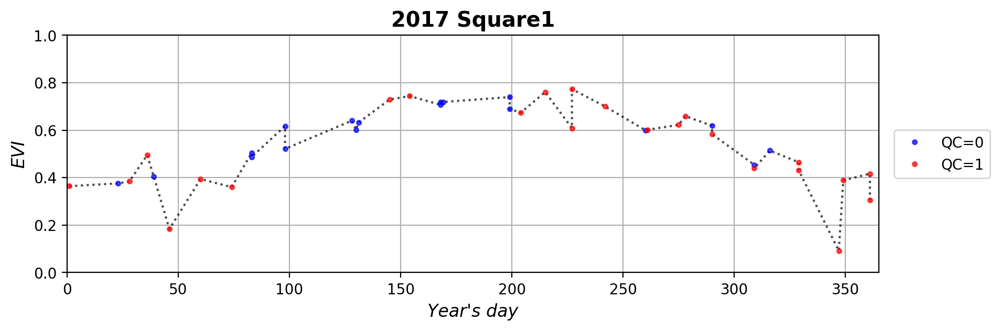

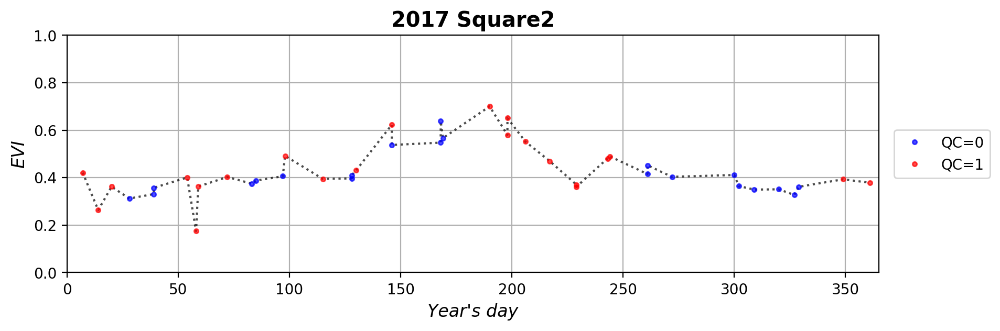

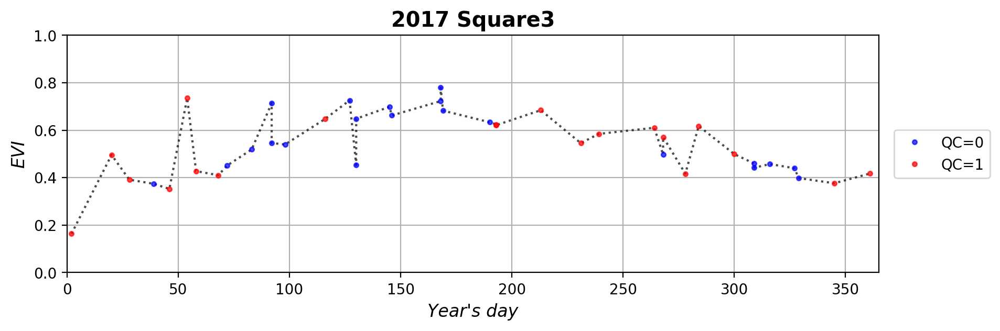

In [6]:
qualityList  = []
doy0RawList, evi0RawList = [], []
doy1RawList, evi1RawList = [], []
doyRawList, eviRawList = [], []
doyDateList  = []

for f in range (len(files)):

    key, value = locationList[f][0], locationList[f][1]

    year = transpose[f][7][0]

    quality  = []
    doy0, evi0 = [], []
    doy1, evi1 = [], []
    doy, evi = [], []
    doyDate  = []

    for index in value:
        quality.append(transpose[f][11][index])

        if quality[-1] == 0:
            doy0.append(transpose[f][8][index])
            evi0.append(transpose[f][9][index])

        elif quality[-1] == 1:
            doy1.append(transpose[f][8][index])
            evi1.append(transpose[f][9][index])

        doy.append(transpose[f][8][index])
        evi.append(transpose[f][9][index])
        doyDate.append(datetime.strptime('{}-{}'.format(transpose[f][8][index], year), '%j-%Y'))
    
    qualityList.append(quality)
    doy0RawList.append(doy0)
    evi0RawList.append(evi0)
    doy1RawList.append(doy1)
    evi1RawList.append(evi1)
    doyRawList.append(doy)
    eviRawList.append(evi)
    doyDateList.append(doyDate)    
    
    graphics([doyRawList[f], doy0RawList[f], doy1RawList[f]],
             [eviRawList[f], evi0RawList[f], evi1RawList[f]],
             ['k:'         , 'bo'          , 'ro'          ],
             [''           , 'QC=0'        , 'QC=1'        ],
             names[f][0])

### Recuperate informations from the selected coordinates and perform a treatment when there are several measurements on an unique date:  <br/> &nbsp;&nbsp;&nbsp; - keep the value with the best quality flag <br/> &nbsp;&nbsp;&nbsp; - calculate the average on a day

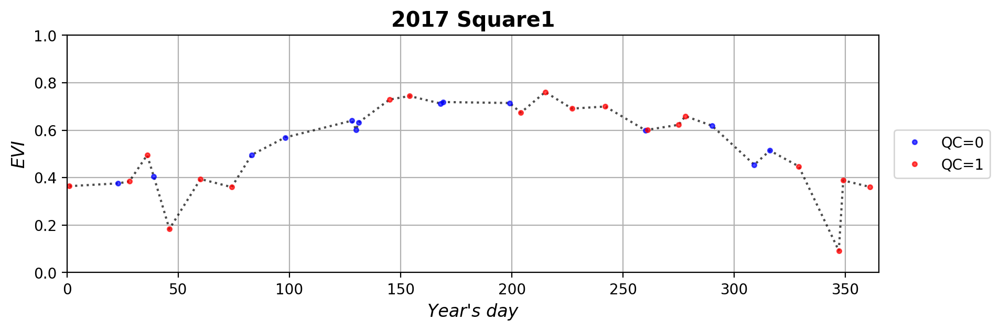

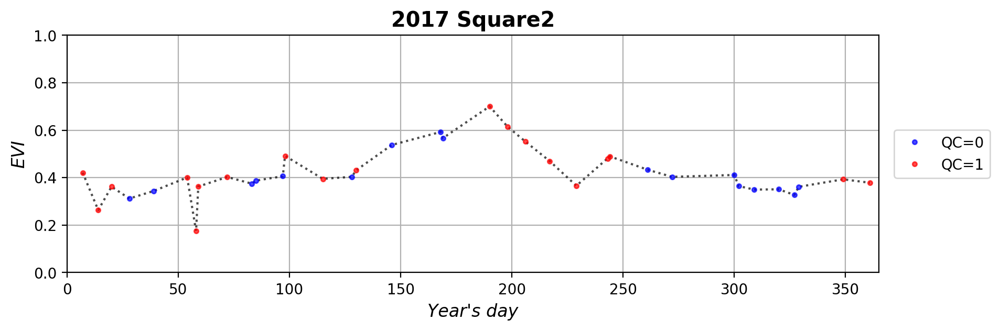

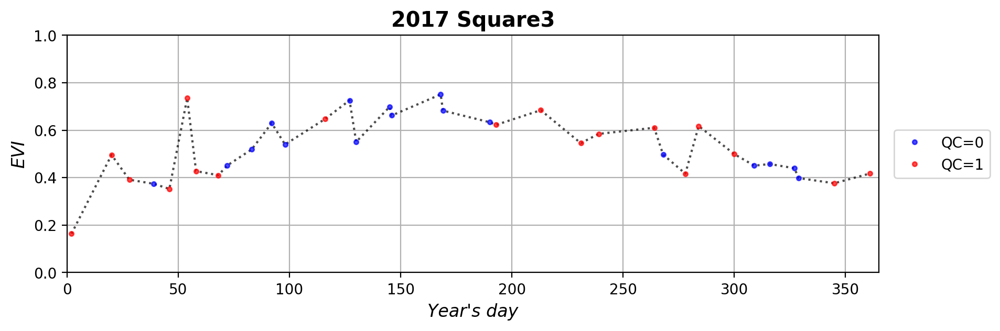

In [7]:
doy0SevList, evi0SevList = [], []
doy1SevList, evi1SevList = [], []

doySevList = deepcopy(doyRawList)
eviSevList = deepcopy(eviRawList)

for f in range (len(files)):
    
    if len(set(doySevList[f])) != len(doySevList[f]):
        # Keep best quality values
        removeIndexes = []
        for i in range (len(doySevList[f])):
            for j in range (i+1, len(doySevList[f])):
                if doySevList[f][i] == doySevList[f][j]:
                    if qualityList[f][i] < qualityList[f][j]:
                        removeIndexes.append(j)
                    elif qualityList[f][j] < qualityList[f][i]:
                        removeIndexes.append(i)

        removeIndexes = sorted(set(removeIndexes), reverse=True)

        for index in removeIndexes:
            del doySevList[f][index]
            del doyDateList[f][index]
            del eviSevList[f][index]
            del qualityList[f][index]

        if len(set(doySevList[f])) != len(doySevList[f]):
            # Take the average
            finished = False
            treatedDays = []
            while finished == False:
                finished = True
                for i in range (len(doySevList[f])):
                    if doySevList[f][i] in treatedDays:
                        continue
                    else:
                        treatedDays.append(doySevList[f][i])
                        indSame = []
                        for j in range (i+1, len(doySevList[f])):
                            if doySevList[f][i] == doySevList[f][j]:
                                indSame.append(j)

                        if len(indSame) > 0:

                            finished = False

                            eviAverage = eviSevList[f][i]

                            for k in indSame:
                                eviAverage += eviSevList[f][k]
                            eviAverage /= (len(indSame) + 1)

                            for k in reversed(indSame):
                                del doySevList[f][k]
                                del doyDateList[f][k]
                                del eviSevList[f][k]
                                del qualityList[f][k]

                            eviSevList[f][i] = eviAverage

                            break
    
    doy0, ndvi0, evi0 = [], [], []
    doy1, ndvi1, evi1 = [], [], []

    for i in range(len(doySevList[f])):
        if qualityList[f][i] == 0:
            doy0.append(doySevList[f][i])
            evi0.append(eviSevList[f][i])

        elif qualityList[f][i] == 1:
            doy1.append(doySevList[f][i])
            evi1.append(eviSevList[f][i])
    
    doy0SevList.append(doy0)
    evi0SevList.append(evi0)
    doy1SevList.append(doy1)
    evi1SevList.append(evi1)

    graphics([doySevList[f], doy0SevList[f], doy1SevList[f]],
             [eviSevList[f], evi0SevList[f], evi1SevList[f]],
             ['k:'         , 'bo'          , 'ro'           ],
             [''           , 'QC=0'        , 'QC=1'         ],
             names[f][0])

### Outliers filtering with polynomial fit of degree 3

In [8]:
doyList = deepcopy(doySevList)
eviList = deepcopy(eviSevList)
#
#eviPolNoFiltering = []
#
#doyPolyList = deepcopy(doyList)
#doyDatePolyList = deepcopy(doyDateList)
#eviRawPolyList = deepcopy(eviList)
#qualityPolyList = deepcopy(qualityList)
#
#weightsPolyList = []
#weightsList = []
#doyHatList = []
#eviPolyList = []
#
#messageList = []
#
#for f in range (len(files)):
#    
#    message = ''
#    
#    doyHat = np.linspace(min(doyPolyList[f]), max(doyPolyList[f]), 1000)
#    doyHat = sorted(list(doyHat) + doyPolyList[f])
#    
#    doyHatList.append(doyHat)
#
#    # Weight list
#    weights = []
#    for q in qualityPolyList[f]:
#        if q == 0:
#            weights.append(1)
#        elif q == 1:
#            weights.append(0.5)
#    
#    weightsList.append(weights)
#    weightsPolyList.append(weights)
#
#    # Iterations to remove outliers
#    finished, it = False, 0
#    while not finished:
#        message += "Iteration {}\n".format(it)
#        it += 1
#
#        finished = True
#
#        # Least squares polynomial fit of degree 3
#        eviPoly = np.poly1d(np.polyfit(doyPolyList[f], eviRawPolyList[f], 3, w=weightsPolyList[f]))(doyHat)
#        
#        if (len(eviPolNoFiltering)) == f:
#            eviPolNoFiltering.append(eviPoly)
#            
#        diff = []
#        for i in range (len(doyPolyList[f])):
#            diff.append(eviRawPolyList[f][i] - eviPoly[doyHat.index(doyPolyList[f][i])])
#
#        standardDev = np.std(diff)
#
#        diff = [abs(d) for d in diff]
#        res = 'passed'
#
#        if max(diff) > 0.2:
#            res = 'deleted'
#            finished = False
#            index = diff.index(max(diff))
#
#            del doyPolyList[f][index]
#            del doyDatePolyList[f][index]
#            del eviRawPolyList[f][index]
#            del qualityPolyList[f][index]
#            del weightsPolyList[f][index]
#
#        message += "Standard deviation = {} & Error max = {} --> {}\n\n".format(round(standardDev,5), round(max(diff),5), res)
#    
#    messageList.append(message)
#    
#    eviPolyList.append(eviPoly)
#
## Graphics
#def updatePlot(file, polFiltering):
#    if polFiltering:
#        print (messageList[file])
#        graphics([doyPolyList[file]   , doyHatList[file] ],
#                 [eviRawPolyList[file], eviPolyList[file]],
#                 ['b:o'               , 'r'              ],
#                 ['Raw data'          , 'Polynomial fit' ],
#                 'Polynomial fit')
#    else:
#        graphics([doyList[file], doyHatList[file]       ],
#                 [eviList[file], eviPolNoFiltering[file]],
#                 ['b:o'        , 'r'                    ],
#                 ['Raw data'   , 'Polynomial fit'       ],
#                 'Polynomial fit')
#
#polFilter = [('w/', True), ('w/o', False)]
#
#interact(updatePlot, file=names, polFiltering=polFilter)

### Perform interpolation to have constant time interval

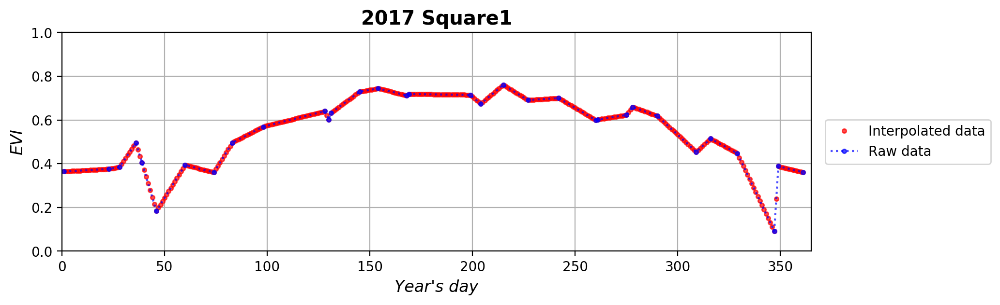

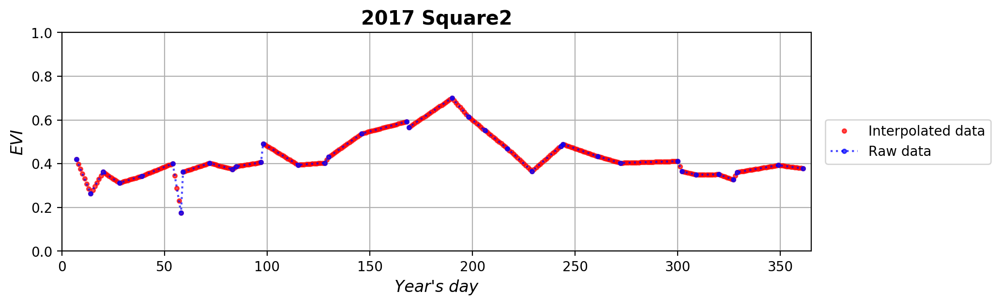

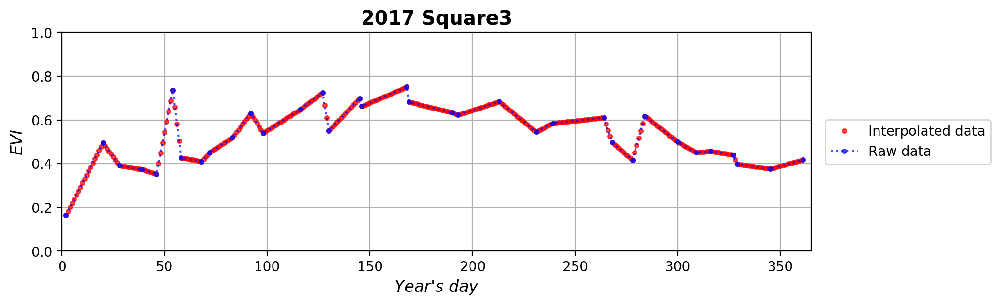

In [9]:
doyUpList, eviUpSeriesList,  eviUpArrayList = [], [], []
#eviUpPchipList = []

for f in range (len(files)):
    # Series values
    eviSeries = pandas.Series(eviList[f], pandas.to_datetime(doyDateList[f]))
    
    eviUpSeries = eviSeries.resample('1D', axis=0, kind='DateTimeIndex').interpolate(method='linear')
#    eviUpPchipSeries = eviSeries.resample('1D', axis=0, kind='DateTimeIndex').interpolate(method='pchip')
    
    # List values
    doyUp = np.arange(min(doyList[f]), max(doyList[f])+1, 1)
    eviUpArray = eviUpSeries.values
    
    doyUpList.append(doyUp)
    eviUpSeriesList.append(eviUpSeries)
    eviUpArrayList.append(eviUpArray)
#    eviUpPchipList.append(eviUpPchipSeries)
    
    graphics([doyUpList[f]        , doyList[f]   ],
             [eviUpArrayList[f]   , eviList[f]   ],
             ['ro'                , 'b:o'        ],
             ['Interpolated data' , 'Raw data'   ],
             names[f][0])

### Kernel regression with different bandwidth

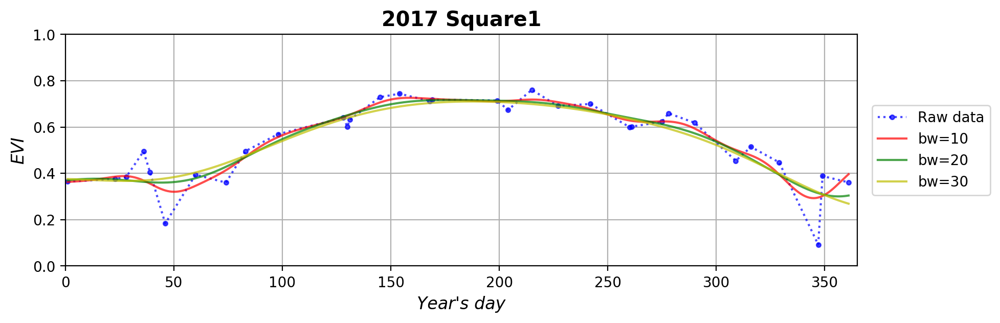

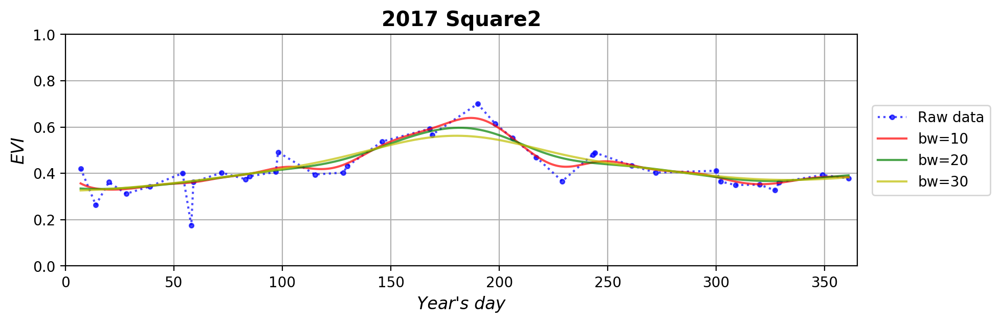

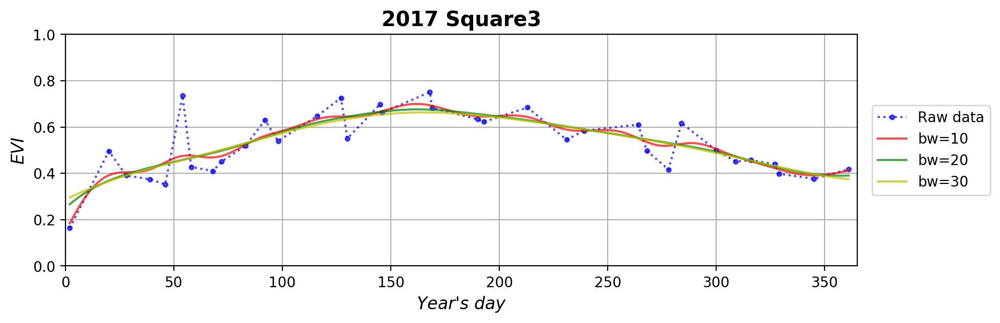

In [10]:
# Non-parametric regression

eviKernel10List, eviKernel20List, eviKernel30List = [], [], []

for f in range (len(files)):
    eviKernel10List.append(KernelReg(eviUpArrayList[f], doyUpList[f], var_type='c', bw=[10]).fit())
    eviKernel20List.append(KernelReg(eviUpArrayList[f], doyUpList[f], var_type='c', bw=[20]).fit())
    eviKernel30List.append(KernelReg(eviUpArrayList[f], doyUpList[f], var_type='c', bw=[30]).fit())
    
    graphics([doyList[f], doyUpList[f]         , doyUpList[f]         , doyUpList[f]         ],
             [eviList[f], eviKernel10List[f][0], eviKernel20List[f][0], eviKernel30List[f][0]],
             ['b:o'     , 'r'                  , 'g'                  , 'y'                  ],
             ['Raw data', 'bw=10'              , 'bw=20'              , 'bw=30'              ],
             names[f][0])

### Lowess smoothing with different "frac"

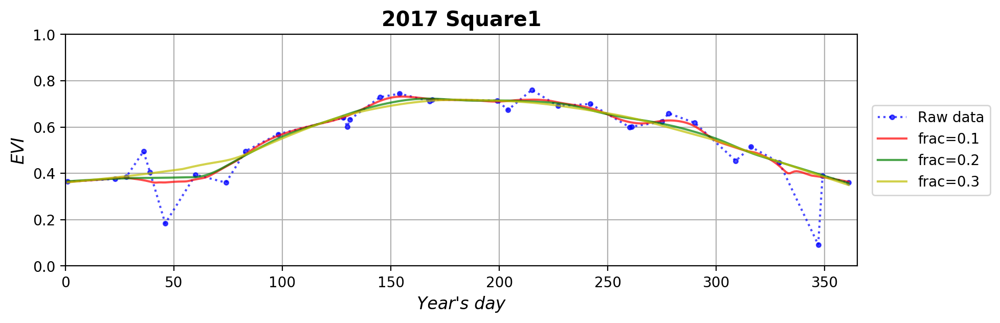

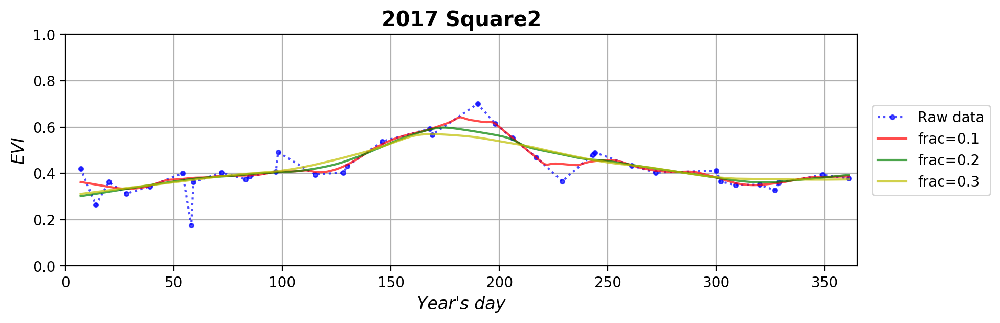

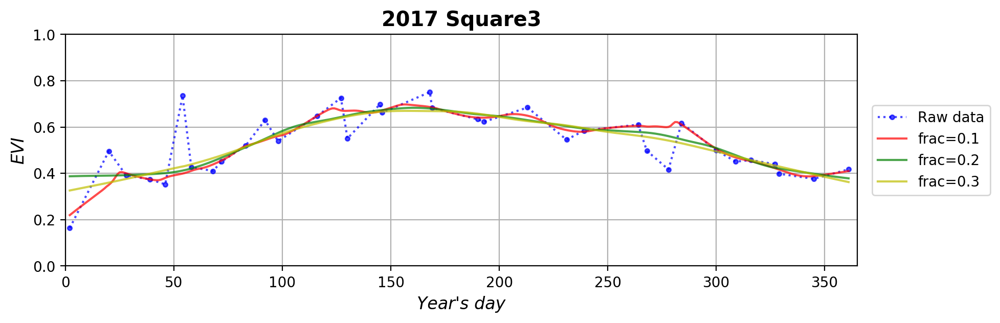

In [11]:
# Non-parametric local regression

eviLowess1List, eviLowess2List, eviLowess3List = [], [], []

for f in range (len(files)):
    eviLowess1List.append(lowess(eviUpArrayList[f], doyUpList[f], frac=0.1, it=10, is_sorted=True))
    eviLowess2List.append(lowess(eviUpArrayList[f], doyUpList[f], frac=0.2, it=10, is_sorted=True))
    eviLowess3List.append(lowess(eviUpArrayList[f], doyUpList[f], frac=0.3, it=10, is_sorted=True))
    
    graphics([doyList[f], eviLowess1List[f][:,0], eviLowess2List[f][:,0], eviLowess3List[f][:,0]],
             [eviList[f], eviLowess1List[f][:,1], eviLowess2List[f][:,1], eviLowess3List[f][:,1]],
             ['b:o'     , 'r'                   , 'g'                   , 'y'                   ],
             ['Raw data', 'frac=0.1'            , 'frac=0.2'            , 'frac=0.3'            ],
             names[f][0])

### Savitzky-Golay filter with order 1 and different "window_length"

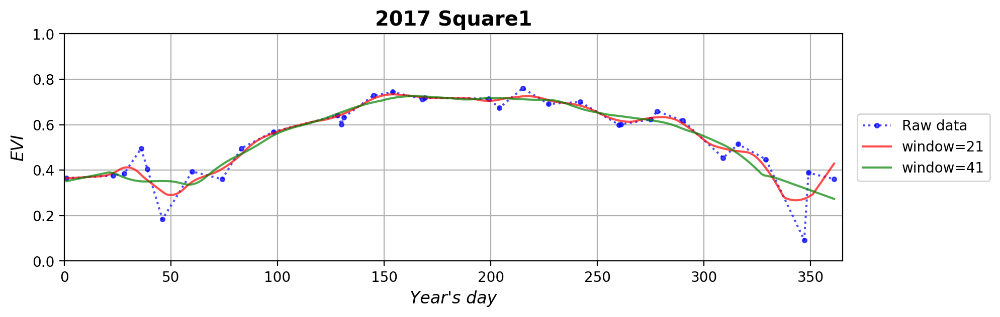

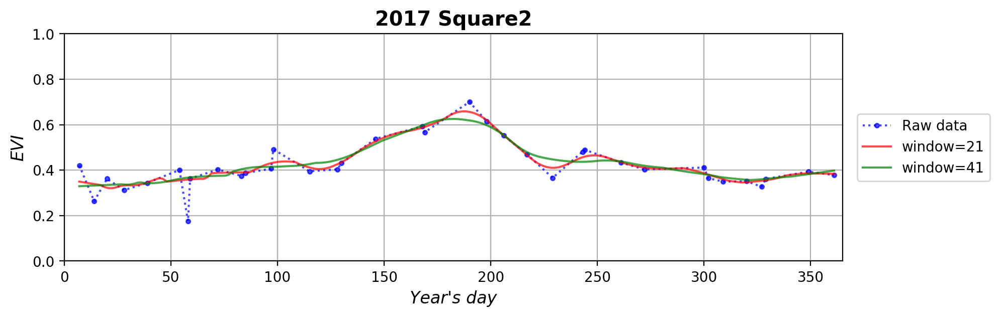

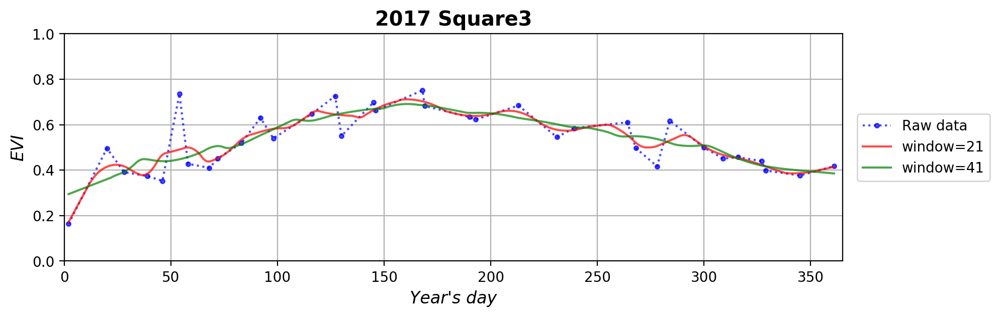

In [12]:
# Local filtering

eviSavGol121List, eviSavGol141List = [], []

for f in range (len(files)):
    eviSavGol121List.append(savgol_filter(eviUpArrayList[f], 21, 1))
    eviSavGol141List.append(savgol_filter(eviUpArrayList[f], 41, 1))
    
    graphics([doyList[f], doyUpList[f]       , doyUpList[f]       ],
             [eviList[f], eviSavGol121List[f], eviSavGol141List[f]],
             ['b:o'     , 'r'                , 'g'                ],
             ['Raw data', 'window=21'        , 'window=41'        ],
             names[f][0])

### Savitzky-Golay filter with order 2 and different "window_length"

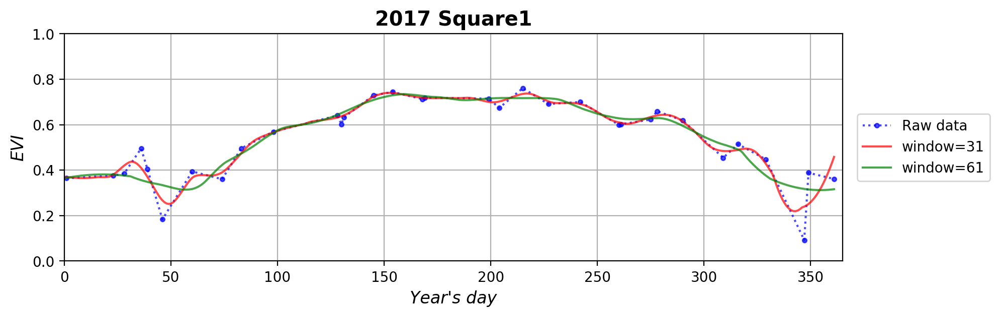

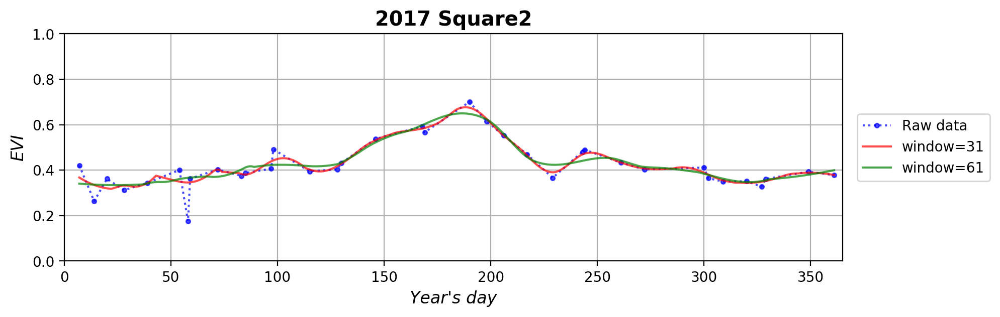

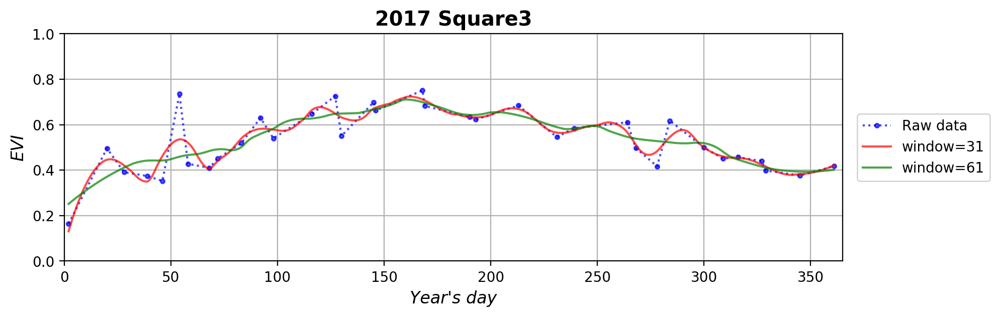

In [13]:
# Local filtering

eviSavGol231List, eviSavGol261List = [], []

for f in range (len(files)):
    eviSavGol231List.append(savgol_filter(eviUpArrayList[f], 31, 2))
    eviSavGol261List.append(savgol_filter(eviUpArrayList[f], 61, 2))
    
    graphics([doyList[f], doyUpList[f]       , doyUpList[f]       ],
             [eviList[f], eviSavGol231List[f], eviSavGol261List[f]],
             ['b:o'     , 'r'                , 'g'                ],
             ['Raw data', 'window=31'        , 'window=61'        ],
             names[f][0])

## Fourier smoothing

### Low pass filter

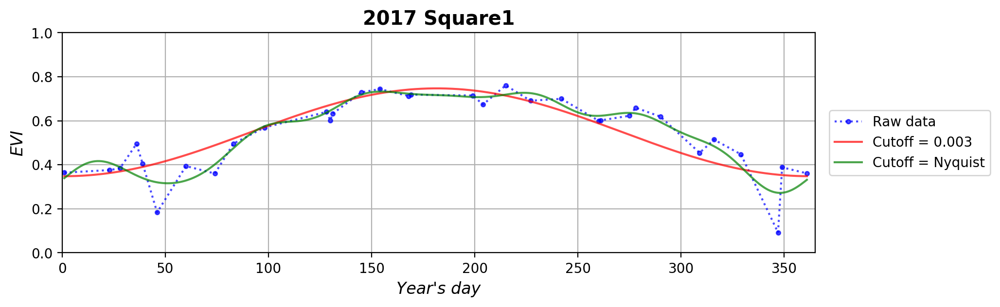

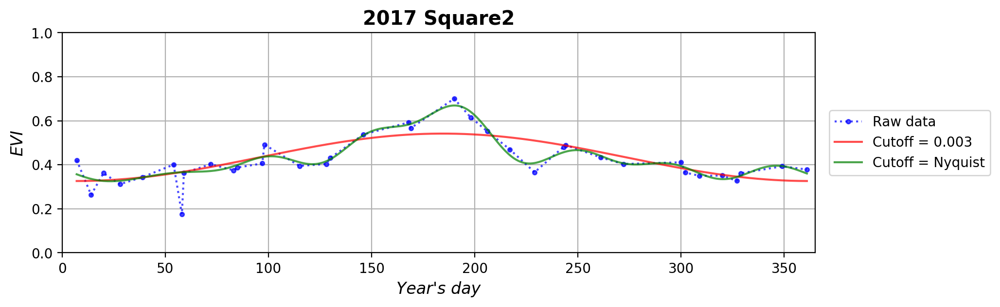

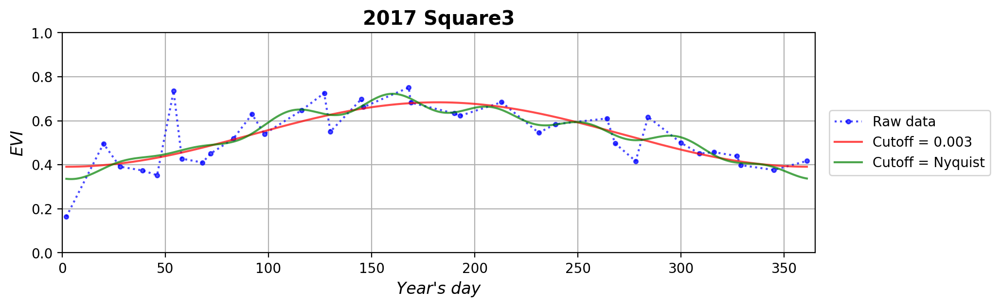

In [14]:
# Secondes per year: 31 536 000

# Sample period: ~365 days
# Sampling freq: ideally, maximum, 365/8 = 45 --> 45/365=1.23*10^(-1)
# Signal freq: 1 signal per year --> 1/365=2.74*10^(-3)

for f in range (len(files)):
    T = doyList[f][-1] - doyList[f][0]     # Sample Period
    fs = len(eviList[f]) / T               # sample rate
    cutoff = 0.003                         # desired cutoff frequency of the filter, slightly higher than actual 2.74*10^(-3)
    
    nyq = 0.5 * fs                         # Nyquist Frequency
    
    eviRft = scipy.fftpack.rfft(eviUpArrayList[f])
    freq = scipy.fftpack.fftfreq(eviUpArrayList[f].size, d=doyUpList[f][1]-doyUpList[f][0])
    
    eviRft[(freq<0)] = 0
    
    eviRftMin = deepcopy(eviRft)
    eviRftMax = deepcopy(eviRft)
    
    eviRftMin[(freq>cutoff)] = 0
    eviRftMax[(freq>nyq)] = 0
    
    eviFourierMin = scipy.fftpack.irfft(eviRftMin, n=len(doyUpList[f]))
    eviFourierMax = scipy.fftpack.irfft(eviRftMax, n=len(doyUpList[f]))
    
    graphics([doyList[f], doyUpList[f]    , doyUpList[f]      ],
             [eviList[f], eviFourierMin   , eviFourierMax     ],
             ['b:o'     , 'r'             , 'g'               ],
             ['Raw data', 'Cutoff = 0.003', 'Cutoff = Nyquist'],
             names[f][0])

### Spectral representation


 For harmonics of rank 21 to 181:

    EVI (real):      mean=0.0006, std=0.2064
    EVI(imaginary):  mean=-0.033, std=0.2362


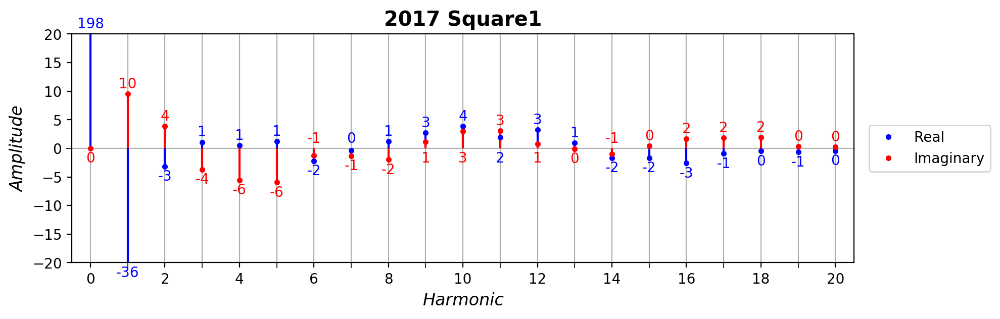


 For harmonics of rank 21 to 178:

    EVI (real):      mean=0.0593, std=0.2144
    EVI(imaginary):  mean=-0.0259, std=0.1932


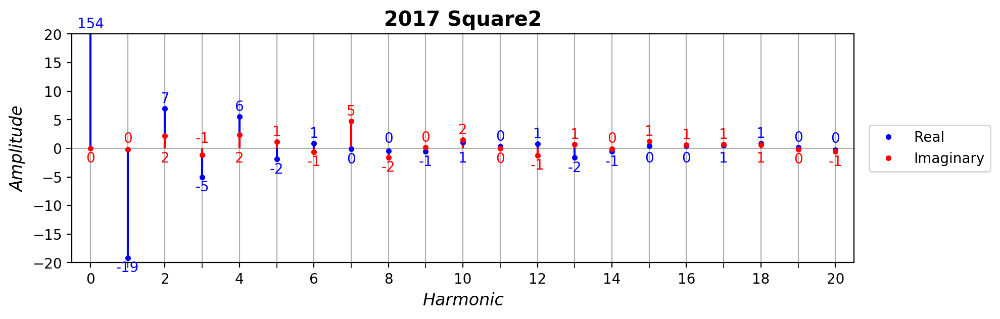


 For harmonics of rank 21 to 181:

    EVI (real):      mean=-0.1404, std=0.2827
    EVI(imaginary):  mean=0.1383, std=0.2651


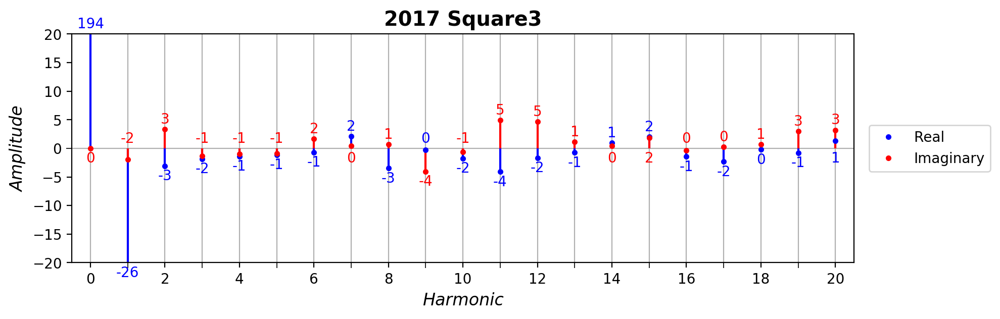

In [15]:
eviRftList, rankList, eviRealList, eviImagList, messageHighestList = [], [], [], [], []

# Frequency
for f in range (len(files)):
    eviRft = np.fft.rfft(eviUpArrayList[f])
    
    rank = np.arange(0, len(eviRft), 1)
    
    eviReal = [a.real for a in eviRft]
    eviImag = [b.imag for b in eviRft]
    
    # For highest values
    messageHighestList.append("For harmonics of rank 21 to {}:\n\n\
    EVI (real):      mean={}, std={}\n\
    EVI(imaginary):  mean={}, std={}".format(len(eviRft), round(np.mean(eviReal[21::]), 4), round(np.std(eviReal[21::]), 4),
                                                          round(np.mean(eviImag[21::]), 4), round(np.std(eviImag[21::]), 4)))
    
    eviRftList.append(eviRft)
    rankList.append(rank)
    eviRealList.append(eviReal)
    eviImagList.append(eviImag)
    
    print ('\n', messageHighestList[f])
    
    rank = (rankList[f])
    eviReal = (eviRealList[f])
    eviImag = (eviImagList[f])
    
    zeros = np.zeros(len(eviRftList[f]))
    
    fig = plt.figure(figsize=(12,3), dpi=200)
    
    plt.title(names[f][0], size='x-large', weight='bold')
    plt.plot(rank, eviReal, 'bo', markersize=3, label='Real')
    plt.plot(rank, eviImag, 'ro', markersize=3, label='Imaginary')
    for i in range (21):
        if (eviReal[i] > eviImag[i]) and (eviImag[i] >= 0):
            if eviReal[i] > 20:
                plt.text(i, 21, int(round(eviReal[i])), color='b', horizontalalignment='center')
            else:
                plt.text(i, eviReal[i]+1, int(round(eviReal[i])), color='b', horizontalalignment='center')
            plt.text(i, -2.5, int(round(eviImag[i])), color='r', horizontalalignment='center')
        elif (eviReal[i] > eviImag[i]) and (eviReal[i] <= 0):
            plt.text(i, 1, int(round(eviReal[i])), color='b', horizontalalignment='center')
            if eviImag[i] < -20:
                plt.text(i, -22.5, int(round(eviImag[i])), color='r', horizontalalignment='center')
            else:
                plt.text(i, eviImag[i]-2.5, int(round(eviImag[i])), color='r', horizontalalignment='center')
        elif (eviReal[i] < eviImag[i]) and (eviReal[i] >= 0):
            plt.text(i, -2.5, int(round(eviReal[i])), color='b', horizontalalignment='center')
            if eviImag[i] > 20:
                plt.text(i, 21, int(round(eviImag[i])), color='r', horizontalalignment='center')
            else:
                plt.text(i, eviImag[i]+1, int(round(eviImag[i])), color='r', horizontalalignment='center')
        elif (eviReal[i] < eviImag[i]) and (eviImag[i] <= 0):
            if eviReal[i] < -20:
                plt.text(i, -22.5, int(round(eviReal[i])), color='b', horizontalalignment='center')
            else:
                plt.text(i, eviReal[i]-2.5, int(round(eviReal[i])), color='b', horizontalalignment='center')
            plt.text(i, 1, int(round(eviImag[i])), color='r', horizontalalignment='center')
        elif (eviReal[i] > 0) and (eviImag[i] < 0):
            if eviReal[i] > 20:
                plt.text(i, 21, int(round(eviReal[i])), color='b', horizontalalignment='center')
            else:
                plt.text(i, eviReal[i]+1, int(round(eviReal[i])), color='b', horizontalalignment='center')
            if eviImag[i] < -20:
                plt.text(i, -22.5, int(round(eviImag[i])), color='r', horizontalalignment='center')
            else:
                plt.text(i, eviImag[i]-2.5, int(round(eviImag[i])), color='r', horizontalalignment='center')
        elif (eviReal[i] < 0) and (eviImag[i] > 0):
            if eviReal[i] < -20:
                plt.text(i, -22.5, int(round(eviReal[i])), color='b', horizontalalignment='center')
            else:
                plt.text(i, eviReal[i]-2.5, int(round(eviReal[i])), color='b', horizontalalignment='center')
            if eviImag[i] > 20:
                plt.text(i, 21, int(round(eviImag[i])), color='r', horizontalalignment='center')
            else:
                plt.text(i, eviImag[i]+1, int(round(eviImag[i])), color='r', horizontalalignment='center')
    
    plt.vlines(rank, zeros, eviReal, 'b')
    plt.vlines(rank, zeros, eviImag, 'r')
    plt.ylabel('Amplitude', size='large', style='italic')
    plt.ylim(-20, 20)
    plt.xlabel('Harmonic', size='large', style='italic')
    plt.xlim(-0.5,20.5)
    plt.legend(loc='center left', bbox_to_anchor=(1.01,0.5))
    
    axes = plt.gca()
    
    axes.set_xticks(np.arange(0, 21, 2), minor=False)
    axes.xaxis.set_ticks(range(0, 21, 1), minor=True)
    axes.xaxis.set_tick_params(length=4, which='minor')
    axes.xaxis.grid(True, which='both')
    
    axes.set_yticks([0], minor=True)
    axes.yaxis.set_tick_params(length=4, which='minor')
    axes.yaxis.set_ticklabels(['0'], minor=True)
    axes.set_yticks([-20, -15, -10, -5, 5, 10, 15, 20], minor=False)
    axes.yaxis.set_ticks([-20, -15, -10, -5, 5, 10, 15, 20], minor=False)
    axes.yaxis.grid(True, which='minor')
    
    fig.subplots_adjust(right=0.77)
    
    plt.show()

### Harmonics filtering

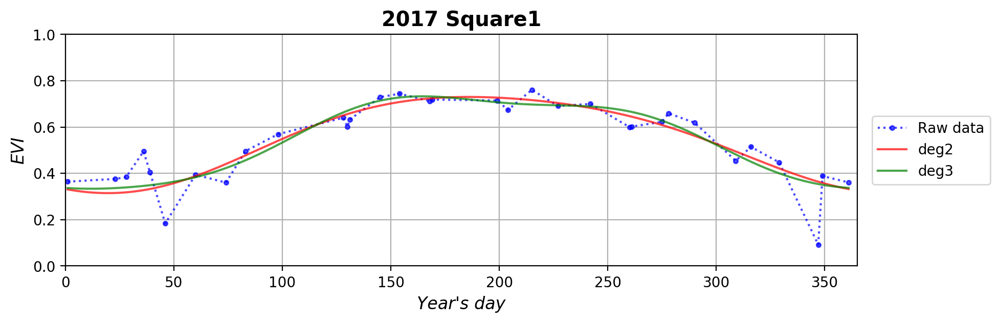

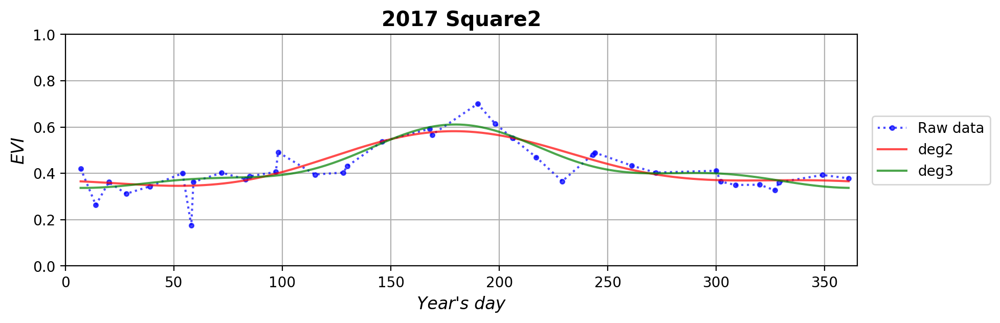

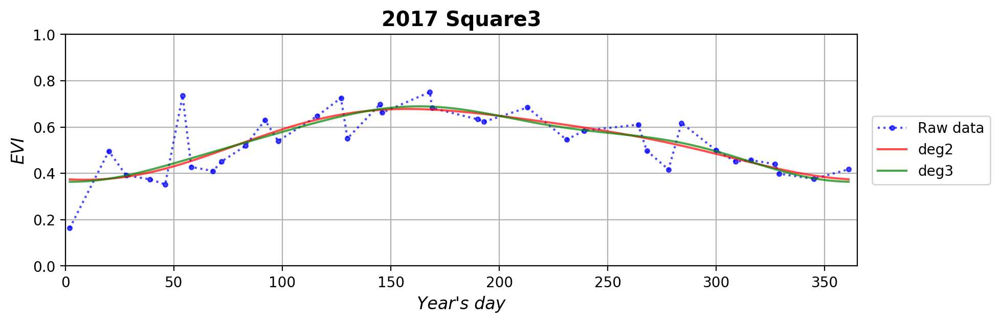

In [16]:
eviFourier2List, eviFourier3List = [], []

# Temporal
for f in range (len(files)):
    # Set the higher order terms to 0 to smooth
    eviRft2 = deepcopy(eviRftList[f])
    eviRft3 = deepcopy(eviRftList[f])
    
    eviRft2[3::] = 0
    eviRft3[4::] = 0
    
    eviFourier2List.append(np.fft.irfft(eviRft2, n=len(doyUpList[f])))
    eviFourier3List.append(np.fft.irfft(eviRft3, n=len(doyUpList[f])))
    
    graphics([doyList[f], doyUpList[f]      , doyUpList[f]      ],
             [eviList[f], eviFourier2List[f], eviFourier3List[f]],
             ['b:o'     , 'r'               , 'g'               ],
             ['Raw data', 'deg2'            , 'deg3'            ],
             names[f][0])